<a href="https://colab.research.google.com/github/LeonardoAAugusto/Projeto/blob/main/ALGORITMO_OPENCV%20PYTHON.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## IDENTIFICADOR DE FIGURAS GEOMÉTRICAS - OPNECV PYTOHN

BAIXANDO BIBLIOTECAS

In [1]:
#Instalação das bibliotecas
!pip install opencv-python --upgrade

CÓDIGO COMPLETO

Carregue uma imagem ou vídeo.


Saving imagem02.png to imagem02.png


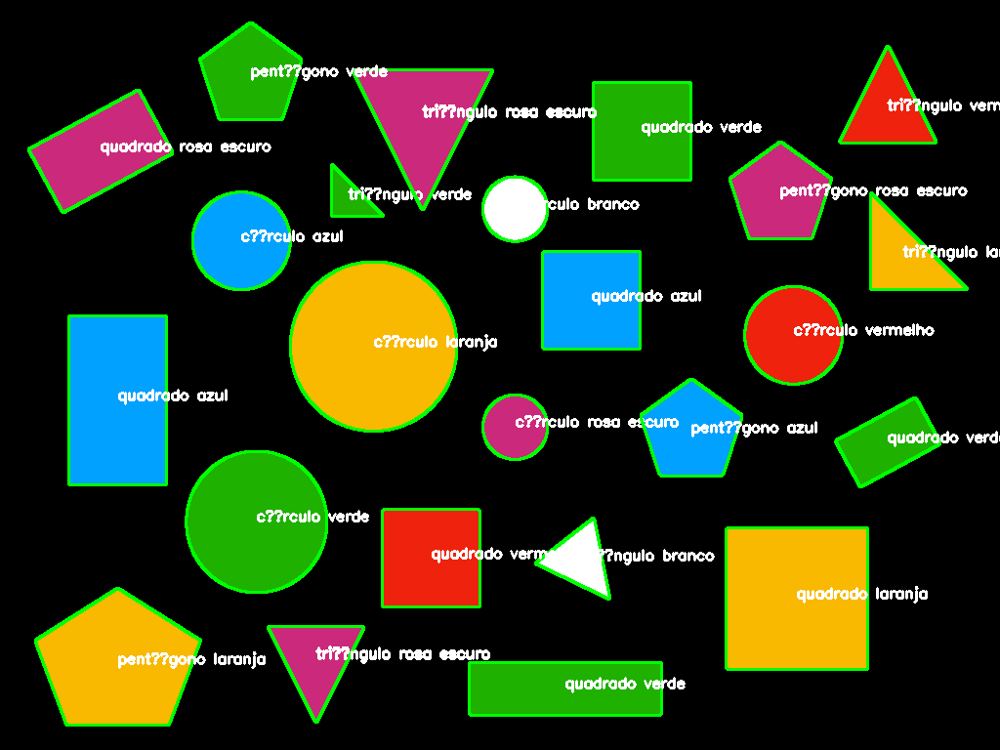

Deseja carregar outro arquivo? (s/n): s
Carregue uma imagem ou vídeo.


Saving imagem03.png to imagem03.png


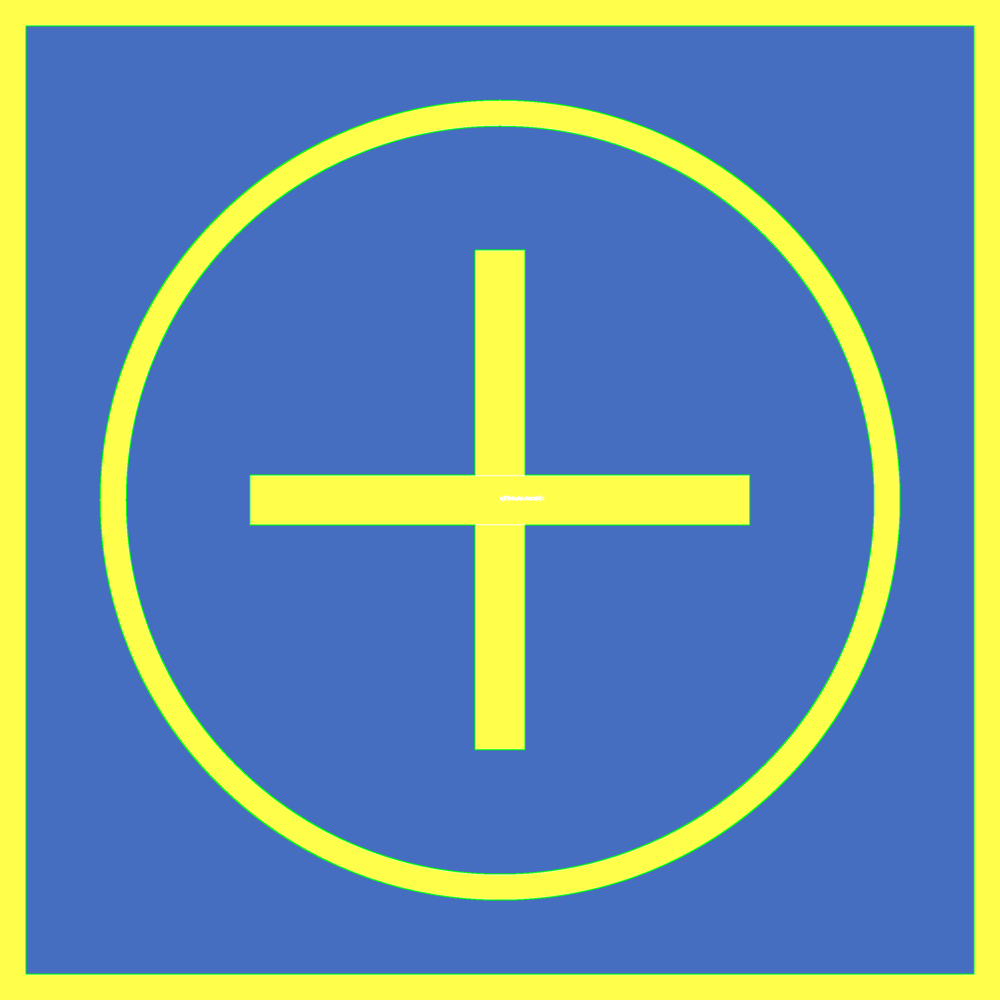

Deseja carregar outro arquivo? (s/n): s
Carregue uma imagem ou vídeo.


Saving imagem04.png to imagem04.png


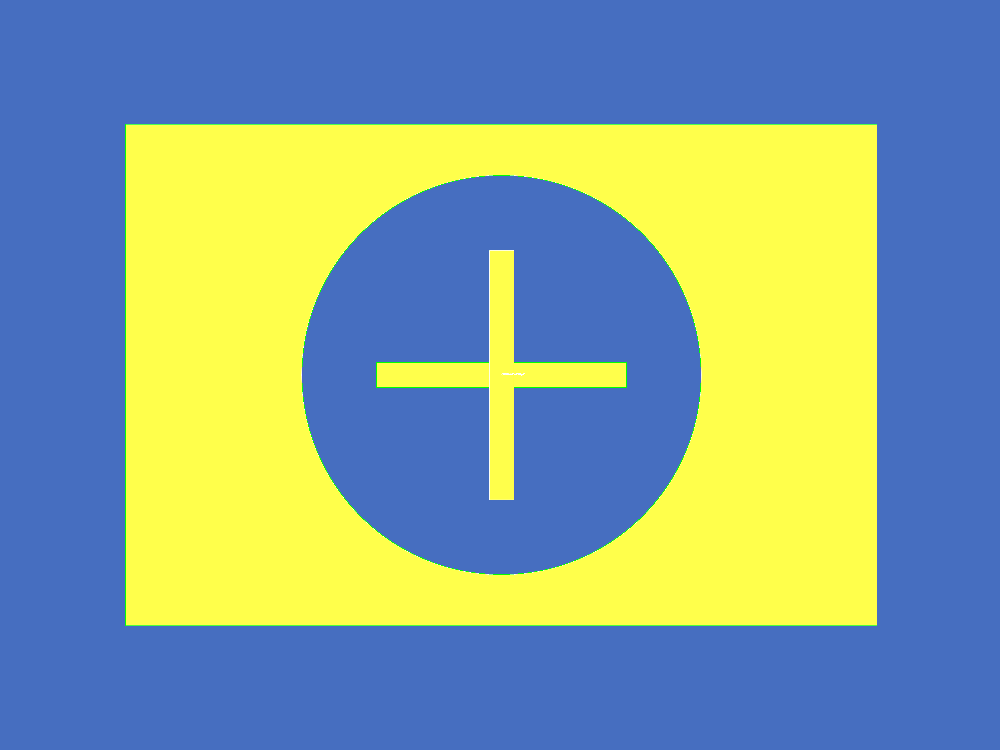

Deseja carregar outro arquivo? (s/n): s
Carregue uma imagem ou vídeo.


Saving Design sem nome (10).mp4 to Design sem nome (10).mp4


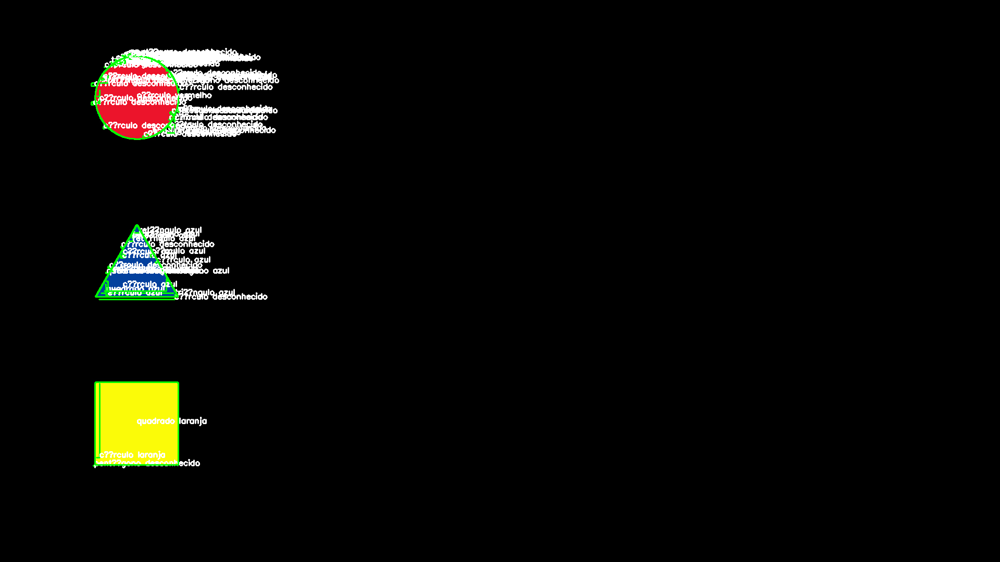

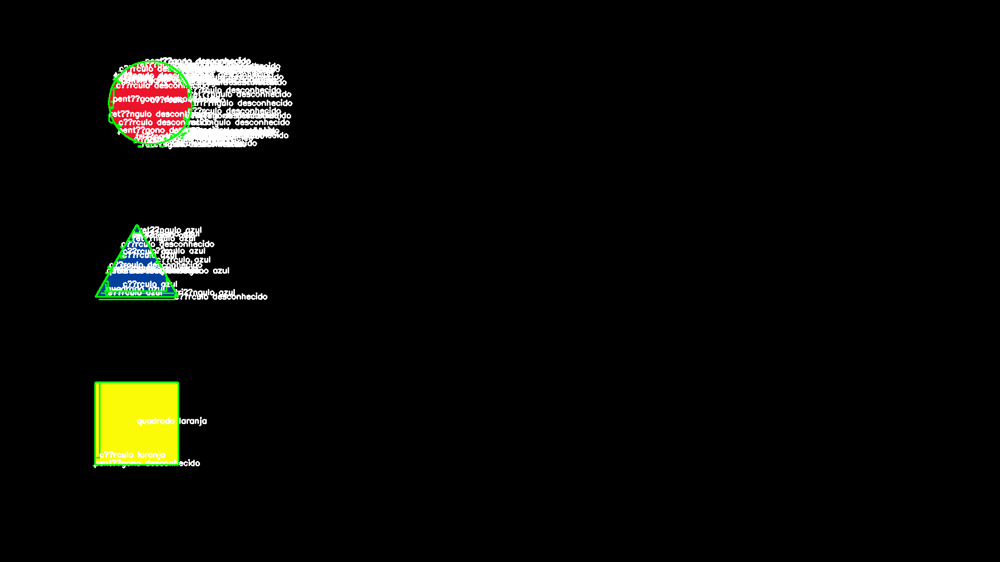

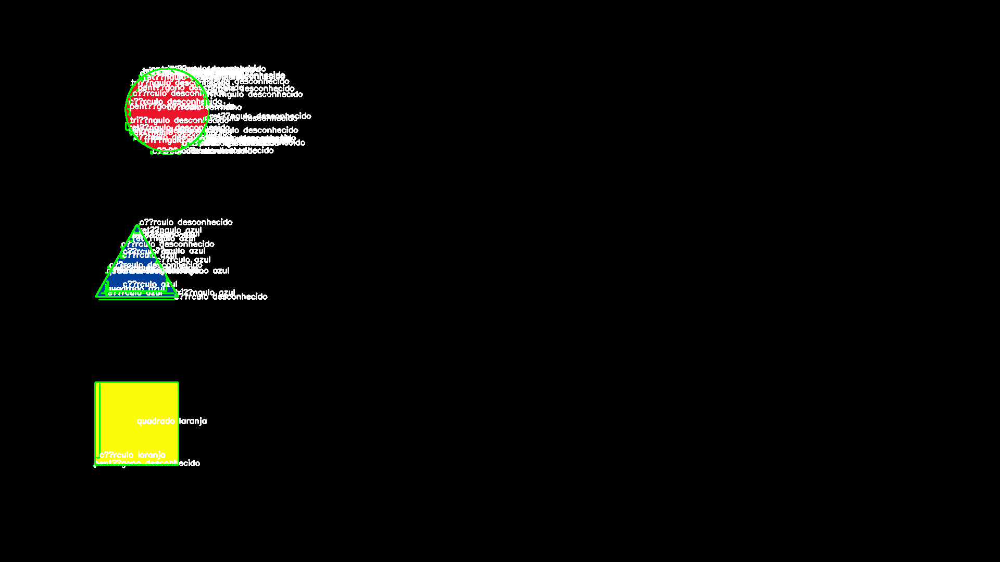

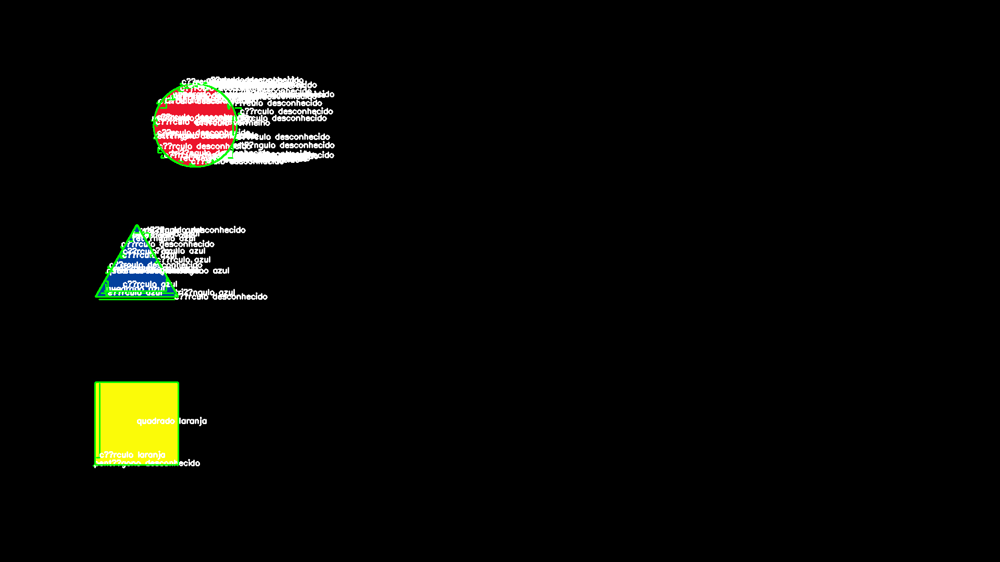

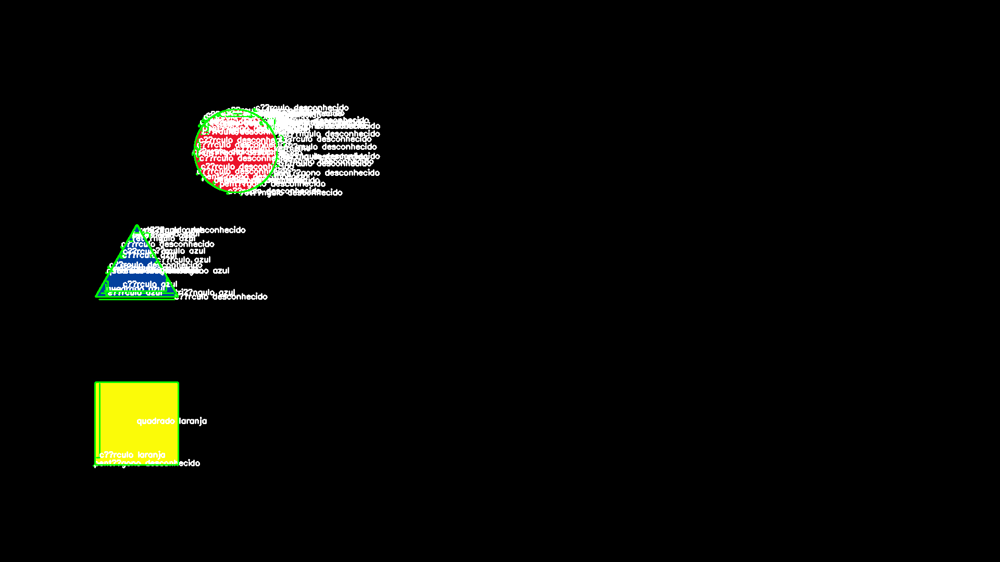

...

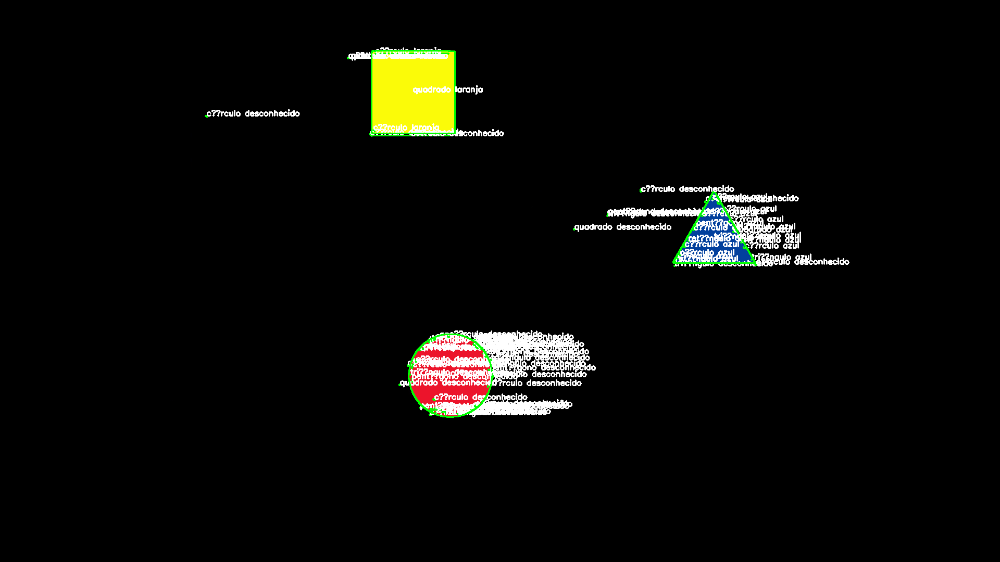

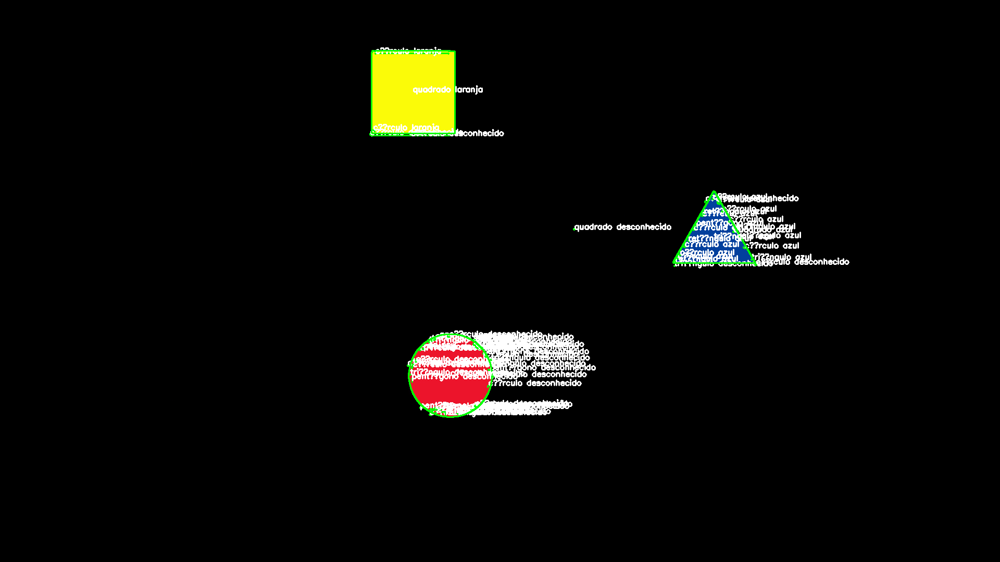

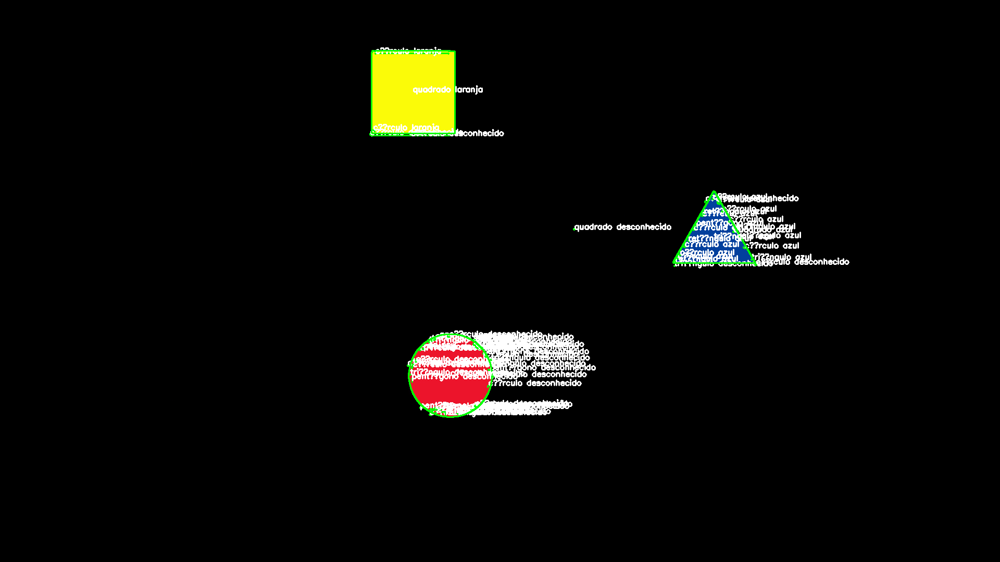

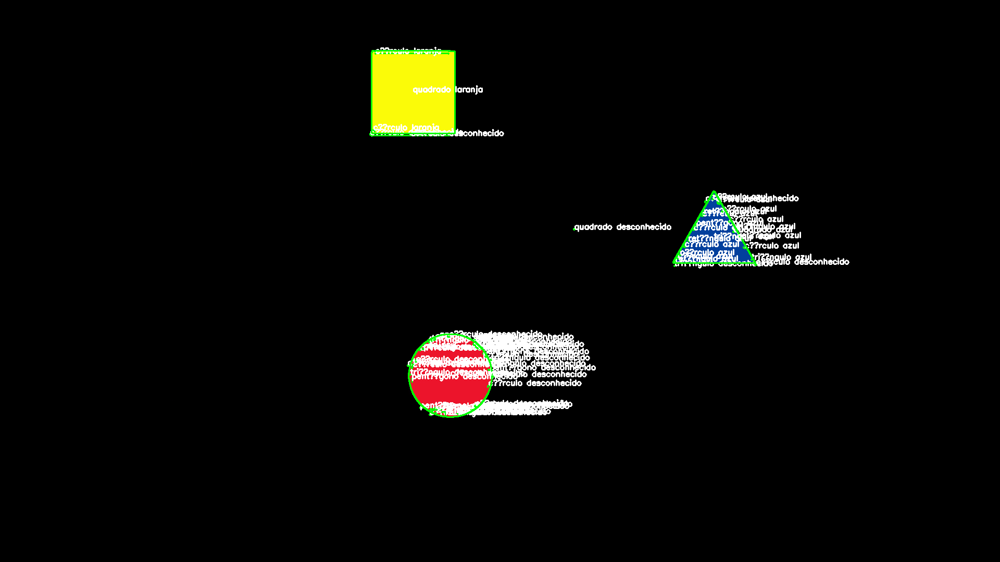

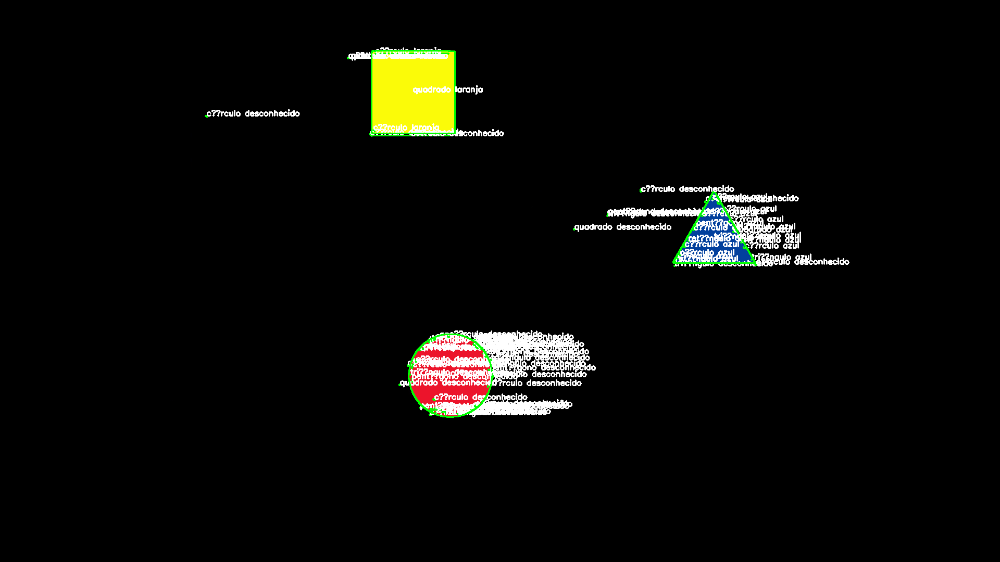

Deseja carregar outro arquivo? (s/n): N
Saindo do programa.


In [2]:
from google.colab import files
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import math

# Definições globais para faixas de cores HSV
COLOR_RANGES = {
    "vermelho": [(0, 50, 50), (10, 255, 255)],
    "azul": [(100, 50, 50), (120, 255, 255)],
    "verde": [(35, 50, 50), (85, 255, 255)],
    "laranja": [(10, 50, 50), (30, 255, 255)],
    "rosa escuro": [(140, 50, 50), (170, 255, 255)],
    "branco": [(0, 0, 200), (180, 50, 255)]
}

# Função para calcular o ângulo entre três pontos
def calculate_angle(p1, p2, p3):
    v1 = (p1[0] - p2[0], p1[1] - p2[1])
    v2 = (p3[0] - p2[0], p3[1] - p2[1])
    dot_product = v1[0] * v2[0] + v1[1] * v2[1]
    magnitude_v1 = math.sqrt(v1[0]**2 + v1[1]**2)
    magnitude_v2 = math.sqrt(v2[0]**2 + v2[1]**2)
    cos_angle = np.clip(dot_product / (magnitude_v1 * magnitude_v2), -1.0, 1.0)
    return math.acos(cos_angle) * 180 / math.pi

# Função para detectar formas geométricas
def detectShape(cnt):
    shape = 'desconhecido'
    peri = cv2.arcLength(cnt, True)
    vertices = cv2.approxPolyDP(cnt, 0.04 * peri, True)
    num_vertices = len(vertices)

    if num_vertices == 3:
        shape = 'triângulo'
    elif num_vertices == 4:
        angles = [calculate_angle(vertices[i-1][0], vertices[i][0], vertices[(i+1) % 4][0]) for i in range(4)]
        shape = "quadrado" if all(85 < angle < 95 for angle in angles) else "retângulo"
    elif num_vertices == 5:
        shape = "pentágono"
    else:
        shape = "círculo"

    return shape

# Função para identificar a cor predominante
def getColor(hsv_img, cnt):
    mask = np.zeros(hsv_img.shape[:2], dtype=np.uint8)
    cv2.drawContours(mask, [cnt], -1, 255, thickness=cv2.FILLED)

    color_counts = {color: cv2.countNonZero(cv2.bitwise_and(mask, cv2.inRange(hsv_img, np.array(lower), np.array(upper))))
                    for color, (lower, upper) in COLOR_RANGES.items()}

    return max(color_counts, key=color_counts.get) if max(color_counts.values()) > 0 else "desconhecido"

# Função principal para processar imagens e vídeos
def process_image_or_video(input_path):
    is_video = input_path.endswith(('.mp4', '.avi', '.mov', '.mkv'))
    cap = cv2.VideoCapture(input_path) if is_video else None
    frame = None

    while True:
        ret, frame = cap.read() if is_video else (True, cv2.imread(input_path))
        if not ret or frame is None:
            break

        gray, hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY), cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        edges = cv2.Canny(gray, int(max(0, (1.0 - 0.33) * np.median(gray))), int(min(255, (1.0 + 0.33) * np.median(gray))))
        contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

        for c in contours:
            M = cv2.moments(c)
            if M['m00'] == 0:
                continue
            cX, cY = int(M['m10'] / M['m00']), int(M['m01'] / M['m00'])
            shape, color = detectShape(c), getColor(hsv, c)
            cv2.drawContours(frame, [c], -1, (0, 255, 0), 2)
            cv2.putText(frame, f'{shape} {color}', (cX, cY), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

        cv2_imshow(frame)
        if not is_video:
            break

    if is_video:
        cap.release()

# Função para carregar arquivo e processar
def upload_and_process():
    uploaded = files.upload()
    file_path = '/content/' + list(uploaded.keys())[0]
    process_image_or_video(file_path)

# Loop de interação com o usuário
while True:
    print("Carregue uma imagem ou vídeo.")
    upload_and_process()
    if input("Deseja carregar outro arquivo? (s/n): ").strip().lower() != 's':
        print("Saindo do programa.")
        break

# Objetivos e Funcionalidades:


1. **Detecção de Formas Geométricas:**

*   O código é capaz de detectar formas geométricas básicas, como círculos, quadrados, triângulos e retângulos. Ele usa a função detectShape, que estima o número de vértices de um contorno e classifica a forma. A detecção leva em consideração a aproximação do contorno usando a função cv2.approxPolyDP para identificar a forma correta.
*   Além disso, o código permite associar um ponto central e um contorno a cada forma detectada, o que facilita a identificação visual durante a execução.

2. **Detecção em Dataset Próprio:**

*   O código foi projetado para ser validado em um conjunto de dados próprio, que pode incluir imagens ou vídeos da base de pouso em diferentes ângulos. A ideia é criar um conjunto com condições variadas (por exemplo, imagens da base de pouso impressas ou capturadas com webcam) para testar a robustez do algoritmo de detecção.
*   A função process_image_or_video processa tanto imagens estáticas quanto vídeos, garantindo flexibilidade no uso.

3. **Parametrização dos Argumentos Usados:**

*   O código foi desenvolvido com parametrização de faixas de cores HSV específicas para as formas geométricas. A constante COLOR_RANGES define as faixas de cores para cada forma, como vermelho, azul, verde, entre outras, permitindo detectar formas coloridas de acordo com o seu tipo.
*   Para facilitar ajustes, o código permite a modificação centralizada de parâmetros como limiares de HSV, tamanhos de kernels e filtros de desfoque (blur), facilitando testes e configurações para melhorar os resultados. Isso também ajuda durante demonstrações ao público, onde a configuração pode ser rapidamente ajustada para se adequar a diferentes condições.

4. **Interface de Usuário (UI) Básica:**

*   O código usa o cv2_imshow para exibir imagens e vídeos de forma interativa. A interface de usuário pode ser melhorada utilizando sliders e selectores do OpenCV para ajustar parâmetros como limites de cor HSV, tamanho de kernel para suavização e filtros de borda em tempo real.
*   A inclusão de tais controles permite ao usuário visualizar as mudanças na detecção de formas à medida que os parâmetros são ajustados, criando uma experiência mais interativa e acessível.

5. **Visualização:**

*   O programa exibe a imagem original com as formas detectadas contornadas, mostrando a classificação da forma (como "círculo", "triângulo", etc.) e a cor associada (por exemplo, "azul" ou "vermelho"). Isso é feito com a função cv2.putText, que coloca o nome da forma e sua cor diretamente sobre a imagem no ponto central da forma detectada.
*   Além disso, a função cv2.drawContours é utilizada para desenhar os contornos das formas detectadas, tornando a visualização clara e precisa.

6. **Estrutura e Como Funciona:**

*   Carregamento de Arquivo: A função upload_and_process permite ao usuário carregar imagens ou vídeos diretamente no Google Colab, facilitando a experimentação com diferentes arquivos.
*   Processamento: A função process_image_or_video lê a entrada (imagem ou vídeo), converte as imagens para o espaço de cor HSV, e aplica técnicas de detecção de bordas, como o Canny, para identificar os contornos. Esses contornos são analisados para determinar a forma e a cor predominante.
Cálculo do Ângulo: A função calculate_angle calcula o ângulo entre três pontos, sendo útil para determinar a geometria das formas, como retângulos e quadrados, e para garantir que as formas sejam corretamente classificadas.